## Brain Tumor Segmentation
Submitted By: <br>
**Group Number 16**

> Atishay Jain (2018B5A70908G)<br>
Aman Jain (2018B5A70868G)<br>
Shubhankar Ravindra Kate (2018B4A70786G)<br>


![](https://storage.googleapis.com/kaggle-competitions/kaggle/29653/logos/header.png)

Paper: [Optimized U-Net for Brain Tumor Segmentation](https://arxiv.org/pdf/2110.03352.pdf)



### Note: You may find the answers to the respective questions regarding the datasets in the corresponding sections:<br>
Is it balanced? -> Section 3 <br>
Why is it relevant to your paper? -> Section 2<br>
What are its limitations -> Section 3<br>

## Introduction and Motivation

Brain tumor segmentation is the process of separating the tumor from normal brain tissues. Brain tumors can appear anywhere in the brain and they can have any kind of shape, size, and contrast. Magnetic resonance imaging (MRI) gives detailed images of the brain, and is one of the most common tests used to diagnose brain tumors. Brain tumor segmentation from MR images can have great impact for improved diagnostics, growth rate prediction and treatment planning.

These reasons motivate us for exploring a deep learning solution which can efficiently perform segmentation of brain tumors. In this project we present a segmentation model based on UNet to diagnose brain tumor. 


### 1. Importing Libraries

In [ ]:
!pip install monai  # For data augmentation (commonly used for medical imagery)
!pip install imio   # For loading and saving image data

In [ ]:
import os
import monai
import torch,torchvision
import skimage
import numpy as np
import pandas as pd 
import glob
import matplotlib.pyplot as plt
from imio import load, save
from monai.utils import first
from monai.config import KeysCollection
from monai.data import Dataset, ArrayDataset, create_test_image_3d, DataLoader
from monai.transforms import (
    Compose,
    AddChanneld,
    LoadImaged,
    Spacingd,
    Resized,
    ScaleIntensityRanged,
    CropForegroundd,
    Resized,
    ToTensor,
    ToTensord,
    Orientationd,
    NormalizeIntensityd,
    RandRotated,
    RandAxisFlipd,
    RandFlipd,
    AdjustContrastd,
)

## 2. Choosing the Dataset

We present two choices of datasets that can be used for training the model:

### 2.1 Dataset Choice 1: BraTS 2021 Challenge Data [1]

The training dataset used for the BraTS21 challenge consists of 1,251 brain mpMRI scans along with segmentation annotations of tumorous regions (annotated manually by experienced neuro-radiologist).

For each sample/patient, four modalities of mpMRI scans are given:
- Fluid Attenuated Inversion Recovery (FLAIR)
- T1-weighted pre-contrast (T1w)
- T1-weighted post-contrast (T1Gd)
- T2-weighted (T2)

Corresponding to each scan, we have one mask with four labels:
- 0 for background (voxels that are not part of the tumor)
- 1 for Necrotic tumor core (NCR)
- 2 for peritumoral edematous tissue (ED)
- 4 for enhancing tumor (ET) 

PS: Label 3 is not used anywhere.

All BraTS multimodal scans are available as NIfTI files (.nii.gz) 

#### Organization of BraTS 2021 Challenge Dataset:
After unzipping the dataset and extracting the .tar file we see that the data is organized as follows:<pre>
/BraTS2021_Training_Data
  ├───BraTS2021_train
       ├──BraTS2021_00000 
       │      └──BraTS2021_00000_flair.nii.gz
       │      └──BraTS2021_00000_t1.nii.gz
       │      └──BraTS2021_00000_t1ce.nii.gz
       │      └──BraTS2021_00000_t2.nii.gz
       │      └──BraTS2021_00000_seg.nii.gz
       ├──BraTS2021_00002
       │      └──BraTS2021_00002_flair.nii.gz
       ...    └──...

#### Loading Data

In [ ]:
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json
! kaggle datasets download dschettler8845/brats-2021-task1
! unzip brats-2021-task1.zip
! rm brats-2021-task1.zip
! rm BraTS2021_Training_Data.tar
! rm /content/BraTS2021_00621.tar

100% 12.3G/12.3G [01:22<00:00, 203MB/s]
100% 12.3G/12.3G [01:22<00:00, 160MB/s]
Archive:  brats-2021-task1.zip
  inflating: BraTS2021_00495.tar     
  inflating: BraTS2021_00621.tar     
  inflating: BraTS2021_Training_Data.tar  


In [ ]:
import tarfile
my_tar = tarfile.open('/content/BraTS2021_00495.tar')
my_tar.extractall('/content/BraTS2021_Sample') # specify which folder to extract to
my_tar.close()
! rm /content/BraTS2021_00495.tar

#### Visualizing BraTS 21

Shape of MRI Images:  (240, 240, 155)
Range of Pixel Values: 0 to 2289.0
Shape of Mask: (240, 240, 155)
Mask Labels: [0. 1. 2. 4.]


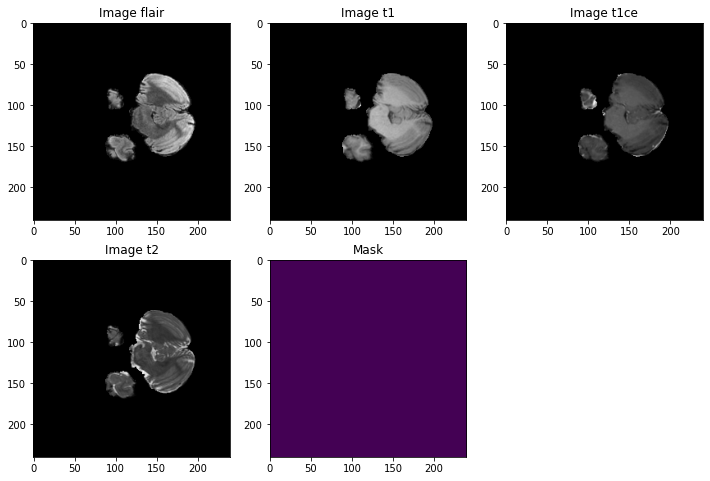

In [ ]:
import nibabel as nib

BraTS_Sample_Path = '/content/BraTS2021_Sample/'

# Load the nii file as numpy array
test_image_flair = nib.load(BraTS_Sample_Path + 'BraTS2021_00495_flair.nii.gz').get_fdata()

test_image_t1 = nib.load(BraTS_Sample_Path + 'BraTS2021_00495_t1.nii.gz').get_fdata()

test_image_t1ce=nib.load(BraTS_Sample_Path + 'BraTS2021_00495_t1ce.nii.gz').get_fdata()

test_image_t2=nib.load(BraTS_Sample_Path + 'BraTS2021_00495_t2.nii.gz').get_fdata()

test_mask = nib.load(BraTS_Sample_Path + 'BraTS2021_00495_seg.nii.gz').get_fdata()

print('Shape of MRI Images: ', test_image_flair.shape)
print('Range of Pixel Values: 0 to', test_image_flair.max())

print('Shape of Mask:', test_mask.shape)
print('Mask Labels:', np.unique(test_mask))  #0, 1, 2, 4 (Need to reencode to 0, 1, 2, 3)

import random
n_slice=random.randint(0, test_mask.shape[2])

plt.figure(figsize=(12, 8))

plt.subplot(231)
plt.imshow(test_image_flair[:,:,n_slice], cmap='gray')
plt.title('Image flair')
plt.subplot(232)
plt.imshow(test_image_t1[:,:,n_slice], cmap='gray')
plt.title('Image t1')
plt.subplot(233)
plt.imshow(test_image_t1ce[:,:,n_slice], cmap='gray')
plt.title('Image t1ce')
plt.subplot(234)
plt.imshow(test_image_t2[:,:,n_slice], cmap='gray')
plt.title('Image t2')
plt.subplot(235)
plt.imshow(test_mask[:,:,n_slice])
plt.title('Mask')
plt.show()

The images in this dataset are 3D. Note the pixel value range from 0 to 2289 (very high range of pixel intensity).

In [ ]:
# For Animation

from matplotlib import animation, rc
rc('animation', html='jshtml')

def create_animation(img):
    fig = plt.figure(figsize=(6, 6))
    plt.axis('off')
    im = plt.imshow(img[:, :, n_slice], cmap="gray")

    def animate_func(i):
        im.set_array(img[:, :, i])
        return im

    return animation.FuncAnimation(fig, animate_func, frames = img.shape[2], interval = 1000//24)

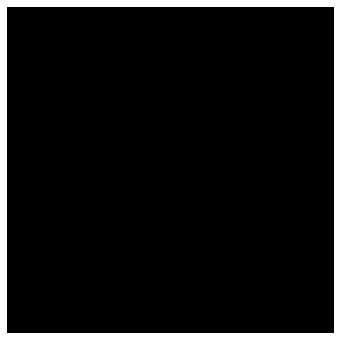

In [ ]:
create_animation(test_image_flair)

### 2.2 Dataset Choice 2: LGG Segmentation Dataset [2]

The LGG Segmentation Dataset consists of 110 sets of mpMRI scans (each set corresponding to one patient) along with segmentation annotations of tumorous regions (annotated manually by experienced neuro-radiologist). Unlike BraTS dataset, where images were 3D and multimodal, here we have unimodal mulitple 2D RGB images (approx. 40 images per sample/patient) corresponding to a single scan, with a separate mask for each image.

MRI Modality in LGG Dataset:
- Fluid Attenuated Inversion Recovery (FLAIR)

Here, each image has a binary mask i.e., has only one label for tumor (does not categorize between the type/stage of tumor).


All LGG scans are available as TIFF files. 


#### Folder Structure


```
kaggle_3m
│
└─── TCGA_CS_4941_19960909
│   │
│   | TCGA_CS_4941_19960909_1.tif
|   | TCGA_CS_4941_19960909_1_mask.tif
│   │ TCGA_CS_4941_19960909_2.tif
│   │ TCGA_CS_4941_19960909_2_mask.tif
│   │ TCGA_CS_4941_19960909_3.tif
│   │ TCGA_CS_4941_19960909_3_mask.tif
│   │ ...
└─── TCGA_CS_4943_20000902
│   │
│   | TCGA_CS_4943_20000902_1.tif
|   | TCGA_CS_4943_20000902_1_mask.tif
│   │ TCGA_CS_4943_20000902_2.tif
│   │ TCGA_CS_4943_20000902_2_mask.tif
│   │ TCGA_CS_4943_20000902_3.tif
│   │ TCGA_CS_4943_20000902_3_mask.tif
│   │ ...


#### Loading Data

In [ ]:
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json
! kaggle datasets download mateuszbuda/lgg-mri-segmentation
! unzip lgg-mri-segmentation.zip
! rm lgg-mri-segmentation.zip

In [ ]:
# Mask Files
mask_files = sorted(glob.glob('/content/lgg-mri-segmentation/kaggle_3m/*/*_mask*'))

mri_files = []
for path in mask_files:
    mri_files.append(path.replace('_mask',''))

#### Visualization of LGG

In [ ]:
print('Number of Images: ', len(mri_files))
print('Number of Masks: ', len(mask_files))

Number of Images:  3929
Number of Masks:  3929


In [ ]:
# Analysing the data using one sample image

sample_mri = plt.imread(mri_files[1])
sample_mask = plt.imread(mask_files[1])

print('Shape of MRI Image (Input): ', sample_mri.shape)
print('Shape of Mask (Label): ', sample_mask.shape)

print('\nRange of Pixel Values (Input): 0 to', sample_mri.max())
# print(sample_mask.max())
print('Range of Pixel Values (Label): ', np.unique(sample_mask), '\n')

Shape of MRI Image (Input):  (256, 256, 3)
Shape of Mask (Label):  (256, 256)

Range of Pixel Values (Input): 0 to 248
Range of Pixel Values (Label):  [  0 255] 



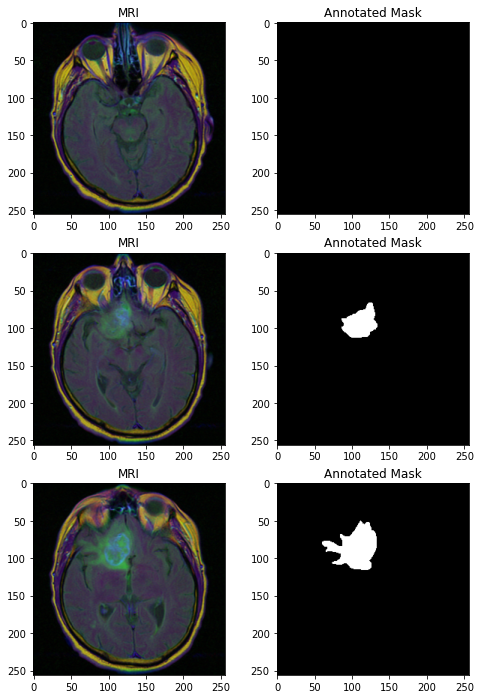

In [ ]:
# Show the first 3 images with their annotated masks

rows = 3
fig, ax = plt.subplots(rows, 2, figsize=(8,12))
for i in range(rows):
    read1 = plt.imread(mri_files[i])
    read2 = plt.imread(mask_files[i])
    ax[i,0].title.set_text("MRI")
    ax[i,1].title.set_text("Annotated Mask")
    ax[i,0].imshow(read1)
    ax[i,1].imshow(read2,cmap='gray')
plt.show()

### Discussion

From the two datasets presented above, it is clear that the amount of data present in even one MRI image is huge which requires great computation power to process. Further, in various implementations of BraTS challenge it was found that only one high contrast modal of image is sufficient to get good results.

Since, LGG dataset is comparatively more practical to process on our machines/colab, without compromising much on the quality of the generated results, we prefer **LGG dataset over BraTS** in this project. 


## 3. Preprocessing & Data Augmentation 

#### Handling bias for no-tumor region

In the visualization of the LGG dataset we saw that there are MRI scans and masks in our dataset where no tumor is present. Even in the images where tumor is present, it lies in a small region of the image. Because of this low ratio of tumorous region to non-tumorous region, our model may be biased to segment a region as non-tumorous.  

To minimize this bias, we remove all the images from our dataset where no tumor is present.

In [ ]:
# A small function to determine if the slice has a tumor or not
def is_tumor(mask_file):

    mask = plt.imread(mask_file)
    return 1 if np.max(mask) != 0.0 else 0

In [ ]:
# Creating a dataframe for easier usage
df = pd.DataFrame({'mri_files':mri_files, 'mask_files':mask_files})
df['tumor'] = df['mask_files'].apply(lambda x: is_tumor(x))

In [ ]:
df.head()

,mri_files,mask_files,tumor
0,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,0
1,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,1
2,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,1
3,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,1
4,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,1


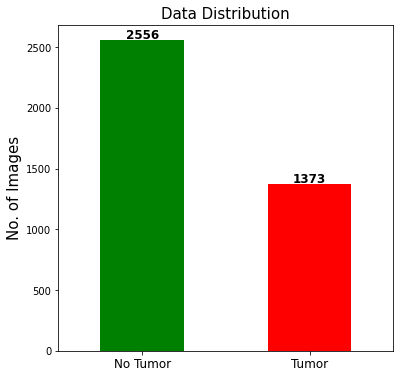

In [ ]:
# Visualising data having and not having masks
df['tumor'].value_counts()

ax = df['tumor'].value_counts().plot(kind='bar', stacked=True, figsize=(6,6), color=['green', 'red'])
ax.set_title('Data Distribution', fontsize=15)
ax.set_ylabel('No. of Images', fontsize=15)
ax.set_xticklabels(['No Tumor', 'Tumor'], fontsize=12, rotation=0)
for i, rows in enumerate(df['tumor'].value_counts().values):
    ax.annotate(int(rows), xy=(i, rows+12), ha='center', fontweight='bold', fontsize=12)

In [ ]:
# Reorganizing data to contain only data points with Tumor

data = df[df['tumor']==1]

print('Size of Training Data reduced to:', data['mri_files'].size)
print('(earlier', df['mri_files'].size, ')')

Size of Training Data reduced to: 1373
(earlier 3929 )


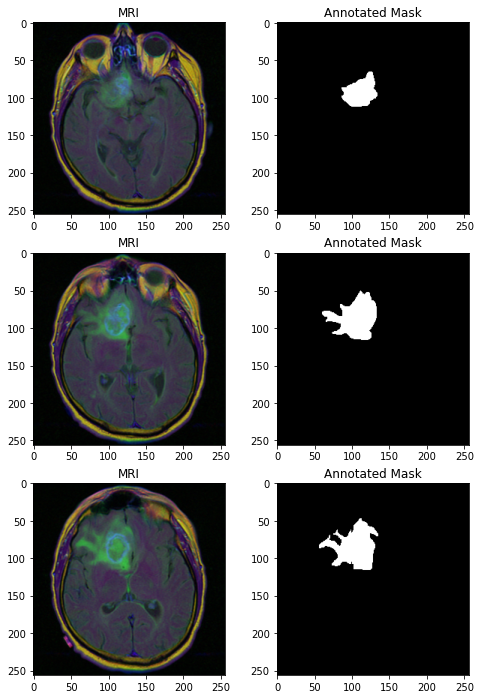

In [ ]:
# Verification that no image without tumor is present
rows = 3
fig,ax = plt.subplots(rows,2,figsize=(8,12))
for i in range(rows):
    read1 = plt.imread(data['mri_files'].iloc[i])
    read2 = plt.imread(data['mask_files'].iloc[i])
    ax[i,0].title.set_text("MRI")
    ax[i,1].title.set_text("Annotated Mask")
    ax[i,0].imshow(read1,cmap='gray')
    ax[i,1].imshow(read2,cmap='gray')
plt.show()

#### Converting Images

In this section we will do two steps:

1. Converting the images from .tff to .nii format since it is a very efficient way when using monai or with medical data in general.

2. Converting the colored images into GrayScale images since It will reduce the model complexity a lot. The model would have difficulty in converging when using colored images as compared to grayscale images.


In [ ]:
# Storing the data in proper directories to use further
parent_dir = '/content/lgg/'
input_out_path = '/content/lgg/input'
mask_out_path = '/content/lgg/mask'

os.mkdir(parent_dir)
os.mkdir(mask_out_path)
os.mkdir(input_out_path)

In [ ]:
# MRI Files
for mri_file in data['mri_files']:
    img = plt.imread(mri_file)
    img = skimage.color.rgb2gray(img)
    name = os.path.basename(os.path.normpath(mri_file))
    name = os.path.splitext(name)[0]
    save.to_nii(img, "{}/{}.nii.gz".format(input_out_path, name))

In [ ]:
# Mask Files
for path in data['mask_files']:
    img = plt.imread(path)
    name = os.path.basename(os.path.normpath(path))
    name = os.path.splitext(name)[0]
    save.to_nii(img, "{}/{}.nii.gz".format(mask_out_path,name))



```
# This is formatted as code
```

#### Resizing and Stretching Image Contrast

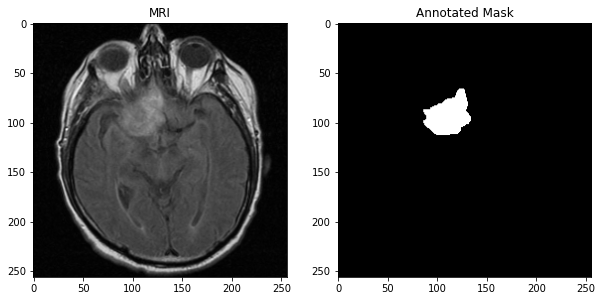

In [ ]:
# An example of the now Grayscale counterpart for our data
fig,ax = plt.subplots(1,2,figsize=(10,5))
img = skimage.color.rgb2gray(plt.imread(data['mri_files'].iloc[0]))
mask = plt.imread(data['mask_files'].iloc[0])
ax[0].title.set_text("MRI")
ax[1].title.set_text("Annotated Mask")
ax[0].imshow(img,cmap='gray')
ax[1].imshow(mask,cmap='gray')

From the Above images we can identify two things
1. The size of the image is **250x250** which is large enough cause issues while fitting in the** GPU Memory**.

2. As we can see that it is difficult to identify tumor in the Brain MRI. To resolve this we can **stretch contrast** accordingly. In high contrast, it becomes easier for the model to identify tumor in the images 

In [ ]:
# First we have to get that .nii data
filenames = []
img = sorted([os.path.normpath(i) for i in glob.glob(input_out_path + '/*')])
mask = sorted([os.path.normpath(i) for i in glob.glob(mask_out_path + '/*')])
for i in range(len(img)):
    filenames.append({'img':img[i],'mask':mask[i]})

print(filenames)

[{'img': '/content/lgg/input/TCGA_CS_4941_19960909_11.nii.gz', 'mask': '/content/lgg/mask/TCGA_CS_4941_19960909_11_mask.nii.gz'}, {'img': '/content/lgg/input/TCGA_CS_4941_19960909_12.nii.gz', 'mask': '/content/lgg/mask/TCGA_CS_4941_19960909_12_mask.nii.gz'}, {'img': '/content/lgg/input/TCGA_CS_4941_19960909_13.nii.gz', 'mask': '/content/lgg/mask/TCGA_CS_4941_19960909_13_mask.nii.gz'}, {'img': '/content/lgg/input/TCGA_CS_4941_19960909_14.nii.gz', 'mask': '/content/lgg/mask/TCGA_CS_4941_19960909_14_mask.nii.gz'}, {'img': '/content/lgg/input/TCGA_CS_4941_19960909_15.nii.gz', 'mask': '/content/lgg/mask/TCGA_CS_4941_19960909_15_mask.nii.gz'}, {'img': '/content/lgg/input/TCGA_CS_4941_19960909_16.nii.gz', 'mask': '/content/lgg/mask/TCGA_CS_4941_19960909_16_mask.nii.gz'}, {'img': '/content/lgg/input/TCGA_CS_4941_19960909_17.nii.gz', 'mask': '/content/lgg/mask/TCGA_CS_4941_19960909_17_mask.nii.gz'}, {'img': '/content/lgg/input/TCGA_CS_4941_19960909_18.nii.gz', 'mask': '/content/lgg/mask/TCGA_CS

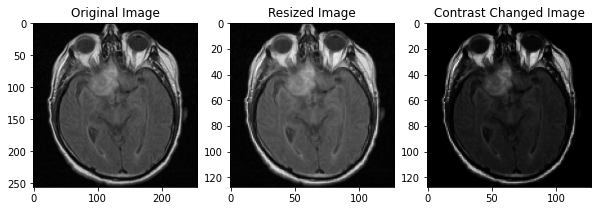

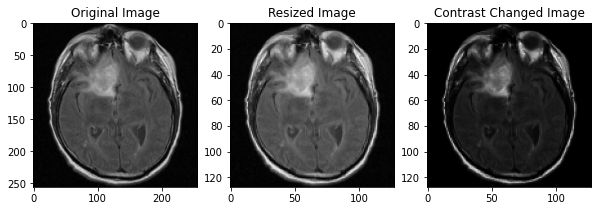

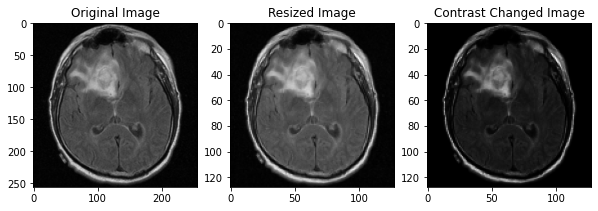

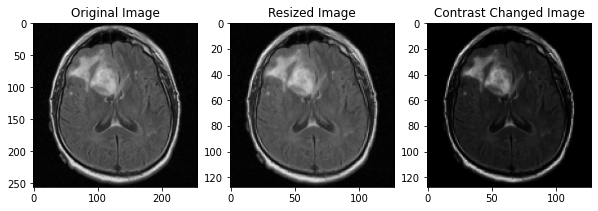

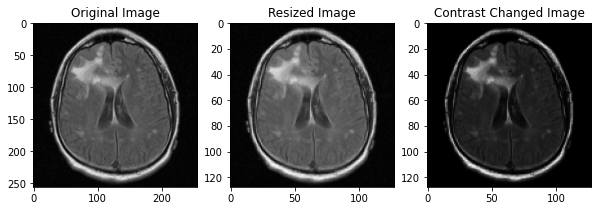

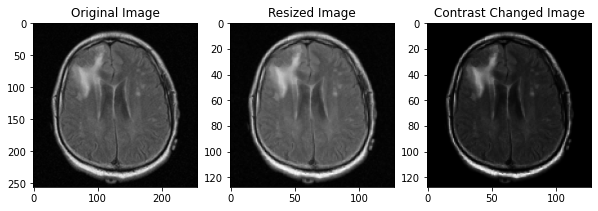

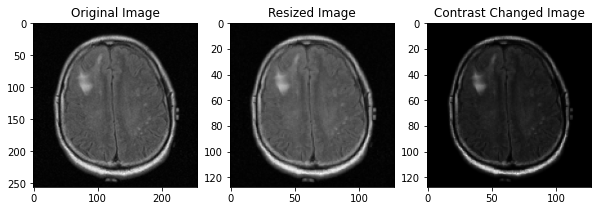

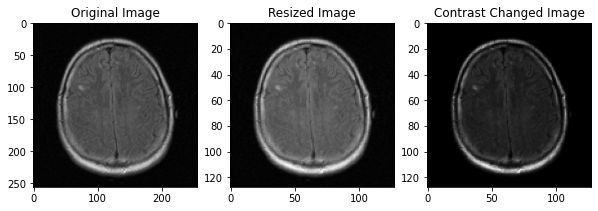

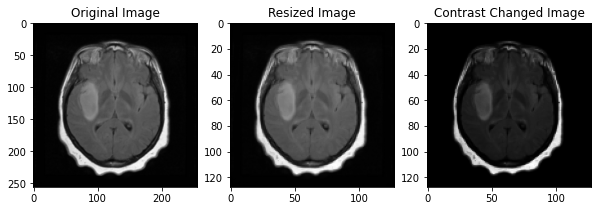

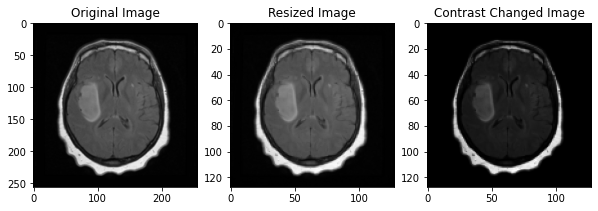

In [ ]:
# This is just an example of what our augmentation is giving us.
# This will also be normalized, but it wont show up on our plot.
# Here we are loading, resizing and changing the contrast of the images.
# We resize the image from 256 x 256 to 128 x 128 for our convenience (Bigger images take more resources to train).

for i in range(0,10):
    li = LoadImaged(keys=['img','mask'])
    li_img = li(filenames[i])
#     print(li_img['img'].shape)
    
    add = AddChanneld(keys=['img','mask'])
    add_img = add(li_img)
    
    res = Resized(spatial_size  = (128,128),keys=['img'])
    res_img = res(add_img)
#     print(res_img['img'].shape)
    
    si = AdjustContrastd(keys=["img"],gamma=2)
    si_img = si(res_img)
    
    fig,ax = plt.subplots(1,3,figsize=(10,5))
    ax[0].title.set_text("Original Image")
    ax[1].title.set_text("Resized Image")
    ax[2].title.set_text("Contrast Changed Image")
    ax[0].imshow(add_img['img'][0,:,:],cmap='gray')
    ax[1].imshow(res_img['img'][0,:,:],cmap='gray')
    ax[2].imshow(si_img['img'][0,:,:],cmap='gray')

In [ ]:
# This is the augmentation block which we have defined, we will be directly using this to make a MONAI dataset.
preprocess = Compose([
    
    LoadImaged(keys=['img','mask']),
    AddChanneld(keys=['img','mask']),
    Resized(spatial_size  = (128,128),keys=['img','mask']),
    AdjustContrastd(keys="img",gamma=2),
    NormalizeIntensityd(keys=['img','mask'],divisor=255.0,subtrahend=0),
    ToTensor(),  
    
])

In [ ]:
# Preparing the Dataset using the above augmentation block
train_data = Dataset(data = filenames, transform = preprocess)

In [ ]:
type(train_data)

monai.data.dataset.Dataset

In [ ]:
from torch.utils.data import random_split

In [ ]:
# Splitting the data into Training, Validation and Testing.
# The values below represent the indivisual values:
# - train_len = 1000
# - valid_len = 200
# - test_len = 173
total_train_ds,test_ds = random_split(train_data,[1200,173])
train_ds, val_ds = random_split(total_train_ds,[1000,200])

In [ ]:
# Creating dataloaders for each (Training, Validation and Testing)
train_loader = DataLoader(train_ds,batch_size = 1)
val_loader = DataLoader(val_ds,batch_size = 1)
test_loader = DataLoader(test_ds,batch_size = 1)

## 4. Building the UNet Model

UNet is a widely used method for biomedical image segmentation. It has an encoder-decoder architecture with skip connections. The encoder is about the covenant layers followed by pooling operation. It is used to extract the factors in the image. The decoder on the other hand uses transposed convolution to permit localization. It is a fully connected layers' network.

Key aspects of UNet:
Convolution Layers: Convolution operation are used learn information from images which then can be used as features for mcahine learning problems

Down Sampling: Sequence of convolution combined with max pooling results in down sampling. In down sampling size of image is reduced which means we can observe larger portion of image in a single convolution operation. Down sampling is a good approach for identifying what is present in the image. but for identifying where the object is we need to use upsampling.

Up Sampling: It is just opposite of down sampling. We go from low resolution to high resolution. For up sampling UNet uses transposed covolution which is achieved by taking transpose of filter kernels and reversing the process of convolution. If you want to learn more please check out this and this.


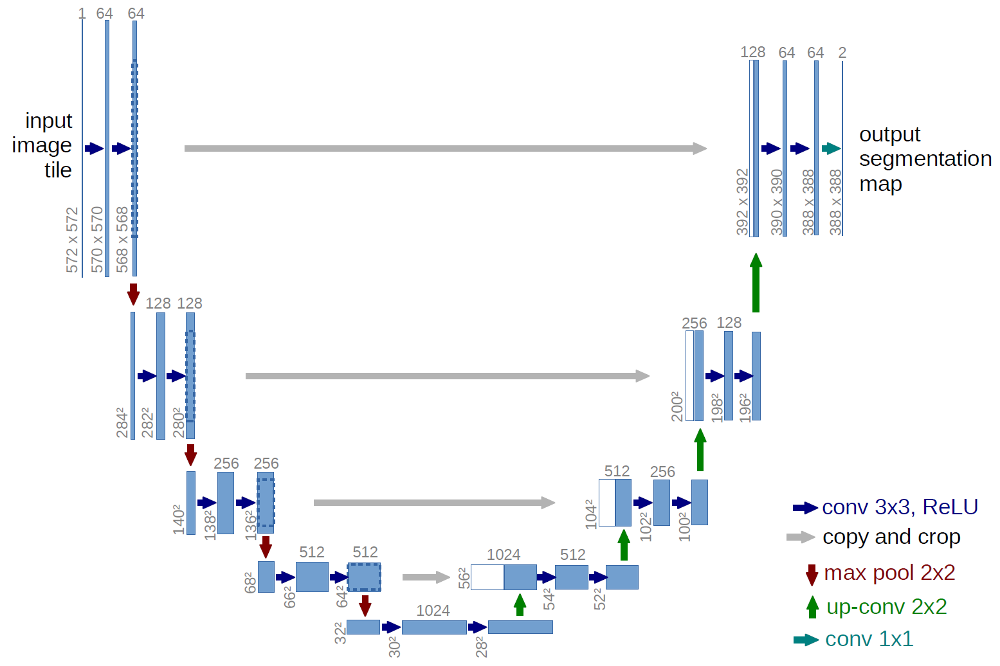

In [ ]:
from tqdm import tqdm
import torch.nn as nn
import torch.nn.functional as F

### Model

In [ ]:
import torch
import torch.nn as nn

from monai.networks.blocks.convolutions import Convolution, ResidualUnit
from monai.networks.layers.simplelayers import SkipConnection

class UNet(nn.Module):

    def __init__(self, block_dims = 2, inp_chans = 1, outp_chans = 1, chan_list = (16, 32, 64, 128, 256, 512), 
    strides = (2, 2, 2, 2, 2), residual_units = 3, dropout = 0.3):

        super().__init__()

        # Input parameters initialised
        self.block_dims = block_dims
        self.inp_chans = inp_chans
        self.outp_chans = outp_chans
        self.chan_list = chan_list
        self.strides = strides
        self.residual_units = residual_units
        self.dropout = dropout

        def recursive_down_up_sampler(inp_ch, outp_ch, chan_list, strides, is_top):
            
            # for every recursive call we choose the first from the channel list and stride respectively
            # these params are then used in building that particular down-sampling and up-sampling layer
            chan = chan_list[0]
            stride = strides[0]

            if len(chan_list) > 2:

                # recursively build the model step by step
                # each iteration we send an updated channel list by removing the first element
                subblock = recursive_down_up_sampler(chan, chan, chan_list[1:], strides[1:], False)  
                up_ch = chan * 2
            
            else:

                # the next layer is the bottom so stop recursion, create the bottom layer as the sublock for this layer
                subblock = self.last_sampler(chan, chan_list[1])
                up_ch = chan + chan_list[1]

            # building a downsampling layer
            down = self.down_sampler(inp_ch, chan, stride)

            # building an upsampling layer
            up = self.up_sampler(up_ch, outp_ch, stride, is_top)

            # sandwiching the downsampling and upsampling layers around the rest of the recursively built model
            # this ensures symmetry as well as removes any possibility of layer discrepancy
            return nn.Sequential(down, SkipConnection(subblock), up)

        self.model = recursive_down_up_sampler(inp_chans, outp_chans, self.chan_list, self.strides, True)

    def down_sampler(self, inp_chans, outp_chans, strides):

        if self.residual_units > 0:
            # Using the inbuilt MONAI residual unit code
            # input, output channels and strides taken as parameters
            down_layer = ResidualUnit(self.block_dims, inp_chans, outp_chans, strides = strides, kernel_size = 3, 
                               subunits = self.residual_units, act = monai.networks.layers.factories.Act.PRELU, norm = monai.networks.layers.factories.Norm.INSTANCE, dropout = self.dropout, bias = True)

            return down_layer

        # for the down sampler, we are using residual units followed by convolutional layers 
        down_layer = Convolution(self.block_dims, inp_chans, outp_chans, strides = strides, kernel_size = 3, 
                          act = monai.networks.layers.factories.Act.PRELU, norm = monai.networks.layers.factories.Norm.INSTANCE, dropout = self.dropout, bias = True)
        return down_layer

    def last_sampler(self, inp_chans, outp_chans):

        # The last layer is extremely similar to the down sampler code, the only difference being the stride is set to 1
        if self.residual_units > 0:

            bottom_layer = ResidualUnit(self.block_dims, inp_chans, outp_chans, strides = 1, kernel_size = 3, subunits = self.residual_units,
                               act = monai.networks.layers.factories.Act.PRELU, norm = monai.networks.layers.factories.Norm.INSTANCE, dropout = self.dropout, bias = True)

            return bottom_layer

        bottom_layer = Convolution(self.block_dims, inp_chans, outp_chans, strides = 1, kernel_size = 3, 
                          act = monai.networks.layers.factories.Act.PRELU, norm = monai.networks.layers.factories.Norm.INSTANCE,
                          dropout = self.dropout, bias = True)

        return bottom_layer

    def up_sampler(self, inp_chans, outp_chans, strides, is_top):


        conv_layer = Convolution(self.block_dims, inp_chans, outp_chans, strides = strides, kernel_size = 3, 
                           act = monai.networks.layers.factories.Act.PRELU, norm = monai.networks.layers.factories.Norm.INSTANCE,
                           dropout = self.dropout, bias = True, conv_only = is_top and self.residual_units == 0,            is_transposed = True)

        if self.residual_units > 0:
            # Using the inbuilt MONAI residual unit code
            # input, output channels and strides taken as parameters
            res_unit = ResidualUnit(self.block_dims, outp_chans, outp_chans, strides = 1, kernel_size = 3, subunits = 1, 
                              act = monai.networks.layers.factories.Act.PRELU, norm = monai.networks.layers.factories.Norm.INSTANCE,
                              dropout = self.dropout, bias = True, last_conv_only = is_top)
            conv_layer = nn.Sequential(conv_layer, res_unit)

        return conv_layer

    def forward(self, x):
        x = self.model(x)
        return x

In [ ]:
model = UNet()
out = model(torch.randn(1, 1, 128, 128))
print(out.shape)

torch.Size([1, 1, 128, 128])


In [ ]:
from torchvision import models
from torchsummary import summary
summary(model, (1,128,128))

In [ ]:
loss_function = monai.losses.DiceLoss(sigmoid=True)
optimizer = torch.optim.Adam(model.parameters(), 1e-3)

In [ ]:
num_epochs = 5
epoch_loss_values = []
val_loss_values = []

### Model Training and Validation

In [ ]:
# Model Training
for epoch in (range(num_epochs)):
        print("-" * num_epochs)
        print(f"epoch {epoch + 1}/{num_epochs}")
        
        model.train()
        
        epoch_loss = 0
        avg_val_loss = 0
        step = 0
        print('Training')
        
        for batch_data in tqdm(train_loader):
            step += 1
            inputs, labels = torch.reshape(batch_data['img'],(1,1,128,128)), batch_data['mask']
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = loss_function(outputs, labels)
            loss.backward()
            optimizer.step()
            epoch_loss += loss.item()
            epoch_len = len(train_ds) // train_loader.batch_size
            
        epoch_loss /= step
        epoch_loss_values.append(epoch_loss)
        
        print('Validating')
        ii = 0
        for batch in tqdm(val_loader):#val_patient
            ii+=1
            inputs, labels = torch.reshape(batch['img'],(1,1,128,128)), batch['mask']
            outputs = model(inputs)
            loss = loss_function(outputs, labels)
            avg_val_loss+=loss.item()
        avg_val_loss = avg_val_loss/ii
        val_loss_values.append(avg_val_loss)
       
        
        print(f"epoch {epoch + 1} average loss: {epoch_loss:.4f} validation_loss: {avg_val_loss:.4f}")

-----
epoch 1/5
Training


100%|██████████| 1000/1000 [03:10<00:00,  5.25it/s]


Validating


 38%|███▊      | 76/200 [00:03<00:06, 20.59it/s]

### Model Evaluation

In [ ]:
model.eval()
eval_loss = 0
eval_loss_values = []
step = 0
with torch.no_grad():
    for batch_data in tqdm(test_loader):
        
        step+=1
        
        inputs, labels = torch.reshape(batch_data['img'], (1,1,128,128)), batch_data['mask']
        
        outputs = model(inputs)
        loss = loss_function(outputs, labels)
            
        eval_loss += loss.item()
    
    eval_loss /= step

100%|██████████| 173/173 [00:06<00:00, 25.87it/s]


In [ ]:
eval_loss

0.28856713888962143

### Loss vs Epoch

Text(0, 0.5, 'Loss')

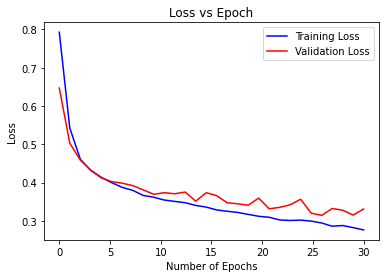

In [ ]:
plt.plot(np.linspace(0,len(epoch_loss_values),len(epoch_loss_values)),epoch_loss_values,color='blue', label='Training Loss')
plt.plot(np.linspace(0,len(val_loss_values),len(val_loss_values)),val_loss_values,color='red', label='Validation Loss')
plt.legend()
plt.title("Loss vs Epoch")
plt.xlabel("Number of Epochs")
plt.ylabel("Loss")

### Visualizing the Results

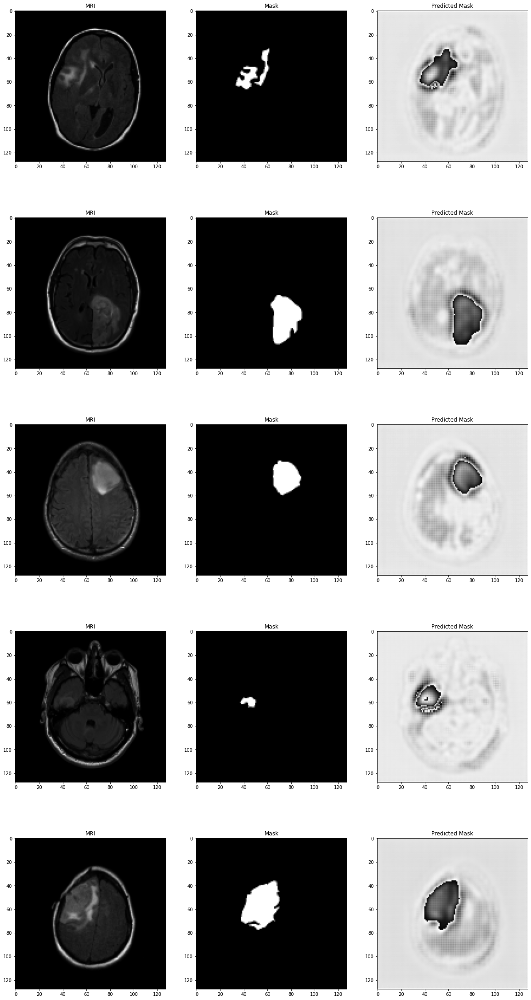

In [ ]:
r = 5
i=0
fig,ax = plt.subplots(r,3,figsize=(20,40))
for batch in test_loader:
    inp = torch.reshape(batch['img'],(1,1,128,128))
    out = model(inp).to('cpu')
    ax[i,0].imshow(batch['img'][0,0,:,:],cmap='gray')
    ax[i,0].title.set_text('MRI')
    ax[i,1].imshow(batch['mask'][0,0,:,:],cmap='gray')
    ax[i,1].title.set_text('Mask')
    ax[i,2].imshow(out[0,0,:,:].detach().numpy().astype('uint8'),cmap='gray')
    ax[i,2].title.set_text('Predicted Mask')
    if i>=r-1:
        break
    i=i+1

In [ ]:
# -----------------------------------------------------------------------------------------------

# Working with Satellite Data

Road building & detection dataset

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!wget --recursive --no-parent https://www.cs.toronto.edu/~vmnih/data/mass_roads/train/sat/index.html

In [ ]:
!wget --recursive --no-parent https://www.cs.toronto.edu/~vmnih/data/mass_roads/train/map/index.html

In [ ]:
#loading all the required libraries 
import os
from os import listdir
import random
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import glob
plt.style.use("ggplot")
%matplotlib inline

from tqdm import tqdm_notebook, tnrange
from itertools import chain
from skimage.io import imread, imshow, concatenate_images
from skimage.transform import resize
from skimage.morphology import label
from sklearn.model_selection import train_test_split

from tqdm import tqdm
import torch.nn as nn
import torch.nn.functional as F

from torch.utils.data import random_split

In [ ]:
masks = sorted(glob.glob('/content/www.cs.toronto.edu/~vmnih/data/mass_roads/train/map/*'))
print('Train Dataset:')
print(masks)

sat_imgs = sorted(glob.glob('/content/www.cs.toronto.edu/~vmnih/data/mass_roads/train/sat/*'))
print((sat_imgs))


Train Dataset:
['/content/www.cs.toronto.edu/~vmnih/data/mass_roads/train/map/10078660_15.tif', '/content/www.cs.toronto.edu/~vmnih/data/mass_roads/train/map/10078675_15.tif', '/content/www.cs.toronto.edu/~vmnih/data/mass_roads/train/map/10078690_15.tif', '/content/www.cs.toronto.edu/~vmnih/data/mass_roads/train/map/10078705_15.tif', '/content/www.cs.toronto.edu/~vmnih/data/mass_roads/train/map/10078720_15.tif', '/content/www.cs.toronto.edu/~vmnih/data/mass_roads/train/map/10078735_15.tif', '/content/www.cs.toronto.edu/~vmnih/data/mass_roads/train/map/10078750_15.tif', '/content/www.cs.toronto.edu/~vmnih/data/mass_roads/train/map/10228660_15.tif', '/content/www.cs.toronto.edu/~vmnih/data/mass_roads/train/map/10228675_15.tif', '/content/www.cs.toronto.edu/~vmnih/data/mass_roads/train/map/10228705_15.tif', '/content/www.cs.toronto.edu/~vmnih/data/mass_roads/train/map/10228720_15.tif', '/content/www.cs.toronto.edu/~vmnih/data/mass_roads/train/map/10228735_15.tif', '/content/www.cs.toronto

### Visualizing Massachusetts Roads Dataset

In [ ]:
print('Number of train images: ', len(sat_imgs))
print('Number of Mask Images: ', len(masks))

Number of train images:  1109
Number of Mask Images:  1109


In [ ]:
# Analysing the data using one sample image

sample_sat = plt.imread(sat_imgs[1])
sample_mask = plt.imread(masks[1])

print('Shape of Satellite Image (Input): ', sample_sat.shape)
print('Shape of Mask (Label): ', sample_mask.shape)

print('\nRange of Pixel Values (Input): 0 to', sample_sat.max())
# print(sample_mask.max())
print('Range of Pixel Values (Label): ', np.unique(sample_mask), '\n')

Shape of Satellite Image (Input):  (1500, 1500, 3)
Shape of Mask (Label):  (1500, 1500)

Range of Pixel Values (Input): 0 to 255
Range of Pixel Values (Label):  [  0 255] 



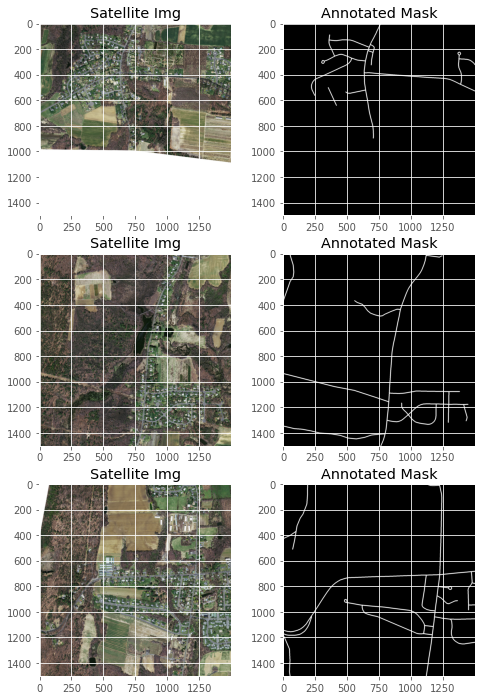

In [ ]:
# Show the first 3 images with their annotated masks

rows = 3
fig, ax = plt.subplots(rows, 2, figsize=(8,12))
for i in range(rows):
    read1 = plt.imread(sat_imgs[i])
    read2 = plt.imread(masks[i])
    ax[i,0].title.set_text("Satellite Img")
    ax[i,1].title.set_text("Annotated Mask")
    ax[i,0].imshow(read1)
    ax[i,1].imshow(read2,cmap='gray')
plt.show()

### Preprocessing

#### Converting Images

As earlier in case of LGG dataset, we will do two steps:

1. Converting the images from .tff to .nii format since it is a very efficient way when using monai or with medical data in general.

2. Converting the colored images into GrayScale images since It will reduce the model complexity a lot. The model would have difficulty in converging when using colored images as compared to grayscale images.


In [ ]:
# Storing the data in proper directories to use further
parent_dir = '/content/sat_data/'
input_out_path = '/content/sat_data/input'
mask_out_path = '/content/sat_data/mask'

os.mkdir(parent_dir)
os.mkdir(mask_out_path)
os.mkdir(input_out_path)

In [ ]:
# Satellite Images
for i in range(500):
    sat_img = sat_imgs[i]
    img = plt.imread(sat_img)
    img = skimage.color.rgb2gray(img)
    name = os.path.basename(os.path.normpath(sat_img))
    print(name)
    name = os.path.splitext(name)[0]
    save.to_nii(img, "{}/{}.nii.gz".format(input_out_path, name))

In [ ]:
var = os.listdir(input_out_path)
print(len(var))

675


In [ ]:
# Masks
for i in range(500):
    mask = masks[i]
    img = plt.imread(mask)
    name = os.path.basename(os.path.normpath(mask))
    name = os.path.splitext(name)[0]
    save.to_nii(img, "{}/{}.nii.gz".format(mask_out_path,name))

In [ ]:
var1 = sorted(os.listdir(input_out_path))
var2 = sorted(os.listdir(mask_out_path))
print(var1)
print(var2)

['10078660_15.nii.gz', '10078675_15.nii.gz', '10078690_15.nii.gz', '10078705_15.nii.gz', '10078720_15.nii.gz', '10078735_15.nii.gz', '10078750_15.nii.gz', '10228660_15.nii.gz', '10228675_15.nii.gz', '10228705_15.nii.gz', '10228720_15.nii.gz', '10228735_15.nii.gz', '10228750_15.nii.gz', '10228765_15.nii.gz', '10228780_15.nii.gz', '10228795_15.nii.gz', '10378660_15.nii.gz', '10378675_15.nii.gz', '10378690_15.nii.gz', '10378705_15.nii.gz', '10378720_15.nii.gz', '10378735_15.nii.gz', '10378750_15.nii.gz', '10378765_15.nii.gz', '10378795_15.nii.gz', '10528660_15.nii.gz', '10528675_15.nii.gz', '10528690_15.nii.gz', '10528705_15.nii.gz', '10528720_15.nii.gz', '10528735_15.nii.gz', '10528750_15.nii.gz', '10528765_15.nii.gz', '10528780_15.nii.gz', '10528795_15.nii.gz', '10678660_15.nii.gz', '10678675_15.nii.gz', '10678690_15.nii.gz', '10678705_15.nii.gz', '10678720_15.nii.gz', '10678735_15.nii.gz', '10678750_15.nii.gz', '10678765_15.nii.gz', '10678780_15.nii.gz', '10678795_15.nii.gz', '10678810

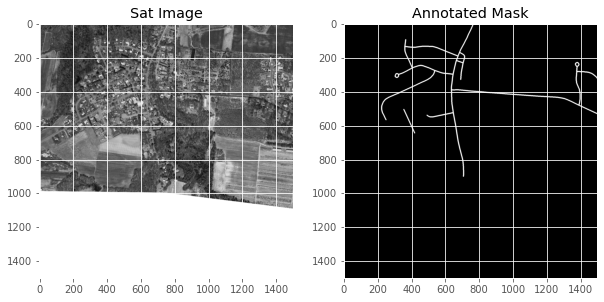

In [ ]:
# An example of the now Grayscale counterpart for our data
fig,ax = plt.subplots(1,2,figsize=(10,5))
img = skimage.color.rgb2gray(plt.imread(sat_imgs[0]))
mask = plt.imread(masks[0])
ax[0].title.set_text("Sat Image")
ax[1].title.set_text("Annotated Mask")
ax[0].imshow(img,cmap='gray')
ax[1].imshow(mask,cmap='gray')

#### Resizing and Stretching Image Contrast

In [ ]:
# First we have to get that .nii data
filenames = []
img = sorted([os.path.normpath(i) for i in glob.glob(input_out_path + '/*')])
mask = sorted([os.path.normpath(i) for i in glob.glob(mask_out_path + '/*')])
for i in range(len(mask)):
    filenames.append({'img':img[i],'mask':mask[i]})

print(filenames)

[{'img': '/content/sat_data/input/10078660_15.nii.gz', 'mask': '/content/sat_data/mask/10078660_15.nii.gz'}, {'img': '/content/sat_data/input/10078675_15.nii.gz', 'mask': '/content/sat_data/mask/10078675_15.nii.gz'}, {'img': '/content/sat_data/input/10078690_15.nii.gz', 'mask': '/content/sat_data/mask/10078690_15.nii.gz'}, {'img': '/content/sat_data/input/10078705_15.nii.gz', 'mask': '/content/sat_data/mask/10078705_15.nii.gz'}, {'img': '/content/sat_data/input/10078720_15.nii.gz', 'mask': '/content/sat_data/mask/10078720_15.nii.gz'}, {'img': '/content/sat_data/input/10078735_15.nii.gz', 'mask': '/content/sat_data/mask/10078735_15.nii.gz'}, {'img': '/content/sat_data/input/10078750_15.nii.gz', 'mask': '/content/sat_data/mask/10078750_15.nii.gz'}, {'img': '/content/sat_data/input/10228660_15.nii.gz', 'mask': '/content/sat_data/mask/10228660_15.nii.gz'}, {'img': '/content/sat_data/input/10228675_15.nii.gz', 'mask': '/content/sat_data/mask/10228675_15.nii.gz'}, {'img': '/content/sat_data/

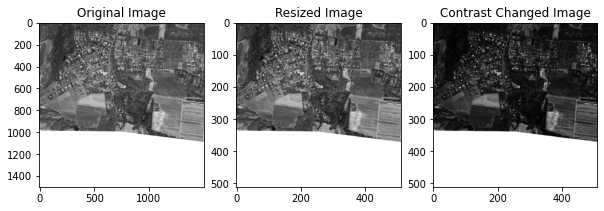

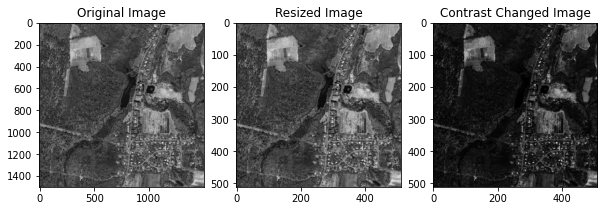

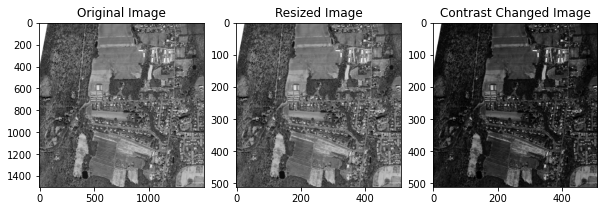

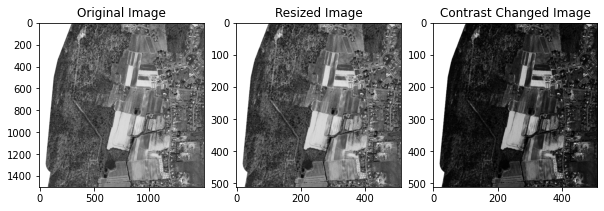

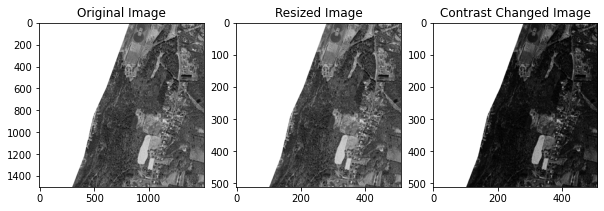

In [ ]:
# This is just an example of what our augmentation is giving us.
# This will also be normalized, but it wont show up on our plot.
# Here we are loading, resizing and changing the contrast of the images.
# We resize the image from 256 x 256 to 128 x 128 for our convenience (Bigger images take more resources to train).

for i in range(0,5):
    li = LoadImaged(keys=['img','mask'])
    li_img = li(filenames[i])
#     print(li_img['img'].shape)
    
    add = AddChanneld(keys=['img','mask'])
    add_img = add(li_img)
    
    res = Resized(spatial_size  = (512,512),keys=['img'])
    res_img = res(add_img)
#     print(res_img['img'].shape)
    
    si = AdjustContrastd(keys=["img"],gamma=2)
    si_img = si(res_img)
    
    fig,ax = plt.subplots(1,3,figsize=(10,5))
    ax[0].title.set_text("Original Image")
    ax[1].title.set_text("Resized Image")
    ax[2].title.set_text("Contrast Changed Image")
    ax[0].imshow(add_img['img'][0,:,:],cmap='gray')
    ax[1].imshow(res_img['img'][0,:,:],cmap='gray')
    ax[2].imshow(si_img['img'][0,:,:],cmap='gray')

In [ ]:
# This is the augmentation block which we have defined, we will be directly using this to make a MONAI dataset.
preprocess_sat = Compose([
    
    LoadImaged(keys=['img','mask']),
    AddChanneld(keys=['img','mask']),
    Resized(spatial_size  = (512,512),keys=['img','mask']),
    AdjustContrastd(keys="img",gamma=2),
    NormalizeIntensityd(keys=['img','mask'],divisor=255.0,subtrahend=0),
    ToTensor(),  
    
])

In [ ]:
# Preparing the Dataset using the above augmentation block
train_data = Dataset(data = filenames, transform = preprocess_sat)

In [ ]:
type(train_data)

monai.data.dataset.Dataset

In [ ]:
# Splitting the data into Training, Validation and Testing.
# The values below represent the indivisual values:
# - train_len = 400
# - valid_len = 50
# - test_len = 50
total_train_ds,test_ds = random_split(train_data,[450,50])
train_ds, val_ds = random_split(total_train_ds,[400,50])

In [ ]:
# Creating dataloaders for each (Training, Validation and Testing)
train_loader = DataLoader(train_ds,batch_size = 1)
val_loader = DataLoader(val_ds,batch_size = 1)
test_loader = DataLoader(test_ds,batch_size = 1)

### Model

In [ ]:
model = UNet()
out = model(torch.randn(1, 1, 512, 512))
print(out.shape)

torch.Size([1, 1, 512, 512])


In [ ]:
from torchvision import models
from torchsummary import summary
summary(model, (1,512,512))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 16, 256, 256]             160
            Conv2d-2         [-1, 16, 256, 256]             160
    InstanceNorm2d-3         [-1, 16, 256, 256]               0
           Dropout-4         [-1, 16, 256, 256]               0
             PReLU-5         [-1, 16, 256, 256]               1
            Conv2d-6         [-1, 16, 256, 256]           2,320
    InstanceNorm2d-7         [-1, 16, 256, 256]               0
           Dropout-8         [-1, 16, 256, 256]               0
             PReLU-9         [-1, 16, 256, 256]               1
           Conv2d-10         [-1, 16, 256, 256]           2,320
   InstanceNorm2d-11         [-1, 16, 256, 256]               0
          Dropout-12         [-1, 16, 256, 256]               0
            PReLU-13         [-1, 16, 256, 256]               1
     ResidualUnit-14         [-1, 16, 2

In [ ]:
loss_function = monai.losses.DiceLoss(sigmoid=True)
optimizer = torch.optim.Adam(model.parameters(), 1e-3)

In [ ]:
num_epochs = 10
epoch_loss_values = []
val_loss_values = []

### Model Training and Validation

In [ ]:
# Model Training
for epoch in (range(num_epochs)):
        print("-" * num_epochs)
        print(f"epoch {epoch + 1}/{num_epochs}")
        
        model.train()
        
        epoch_loss = 0
        avg_val_loss = 0
        step = 0
        print('Training')
        
        for batch_data in tqdm(train_loader):
            step += 1
            inputs, labels = torch.reshape(batch_data['img'],(1,1,512,512)), batch_data['mask']
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = loss_function(outputs, labels)
            loss.backward()
            optimizer.step()
            epoch_loss += loss.item()
            epoch_len = len(train_ds) // train_loader.batch_size
            
        epoch_loss /= step
        epoch_loss_values.append(epoch_loss)
        
        print('Validating')
        ii = 0
        for batch in tqdm(val_loader):#val_patient
            ii+=1
            inputs, labels = torch.reshape(batch['img'],(1,1,512,512)), batch['mask']
            outputs = model(inputs)
            loss = loss_function(outputs, labels)
            avg_val_loss+=loss.item()
        avg_val_loss = avg_val_loss/ii
        val_loss_values.append(avg_val_loss)
       
        
        print(f"epoch {epoch + 1} average loss: {epoch_loss:.4f} validation_loss: {avg_val_loss:.4f}")

----------
epoch 1/10
Training


100%|██████████| 400/400 [08:56<00:00,  1.34s/it]


Validating


100%|██████████| 50/50 [00:32<00:00,  1.54it/s]


epoch 1 average loss: 0.8995 validation_loss: 0.8698
----------
epoch 2/10
Training


100%|██████████| 400/400 [08:29<00:00,  1.27s/it]


Validating


100%|██████████| 50/50 [00:31<00:00,  1.59it/s]


epoch 2 average loss: 0.8522 validation_loss: 0.8088
----------
epoch 3/10
Training


100%|██████████| 400/400 [08:25<00:00,  1.26s/it]


Validating


100%|██████████| 50/50 [00:32<00:00,  1.53it/s]


epoch 3 average loss: 0.7980 validation_loss: 0.7545
----------
epoch 4/10
Training


100%|██████████| 400/400 [08:35<00:00,  1.29s/it]


Validating


100%|██████████| 50/50 [00:32<00:00,  1.56it/s]


epoch 4 average loss: 0.7570 validation_loss: 0.7196
----------
epoch 5/10
Training


100%|██████████| 400/400 [08:37<00:00,  1.29s/it]


Validating


100%|██████████| 50/50 [00:31<00:00,  1.57it/s]


epoch 5 average loss: 0.7312 validation_loss: 0.6989
----------
epoch 6/10
Training


100%|██████████| 400/400 [08:29<00:00,  1.27s/it]


Validating


100%|██████████| 50/50 [00:32<00:00,  1.53it/s]


epoch 6 average loss: 0.7134 validation_loss: 0.6838
----------
epoch 7/10
Training


100%|██████████| 400/400 [08:47<00:00,  1.32s/it]


Validating


100%|██████████| 50/50 [00:36<00:00,  1.36it/s]


epoch 7 average loss: 0.7010 validation_loss: 0.6735
----------
epoch 8/10
Training


100%|██████████| 400/400 [08:33<00:00,  1.28s/it]


Validating


100%|██████████| 50/50 [00:31<00:00,  1.58it/s]


epoch 8 average loss: 0.6933 validation_loss: 0.6675
----------
epoch 9/10
Training


100%|██████████| 400/400 [08:40<00:00,  1.30s/it]


Validating


100%|██████████| 50/50 [00:32<00:00,  1.53it/s]


epoch 9 average loss: 0.6858 validation_loss: 0.6614
----------
epoch 10/10
Training


100%|██████████| 400/400 [08:31<00:00,  1.28s/it]


Validating


100%|██████████| 50/50 [00:32<00:00,  1.55it/s]

epoch 10 average loss: 0.6797 validation_loss: 0.6571


### Model Evaluation

In [ ]:
model.eval()
eval_loss = 0
eval_loss_values = []
step = 0
with torch.no_grad():
    for batch_data in tqdm(test_loader):
        
        step+=1
        
        inputs, labels = torch.reshape(batch_data['img'], (1,1,512,512)), batch_data['mask']
        
        outputs = model(inputs)
        loss = loss_function(outputs, labels)
            
        eval_loss += loss.item()
    
    eval_loss /= step

100%|██████████| 50/50 [00:29<00:00,  1.72it/s]


In [ ]:
print('Evaluation Loss: ', eval_loss)

Evaluation Loss:  0.5807944977283478


### Loss vs Epoch

Text(0, 0.5, 'Loss')

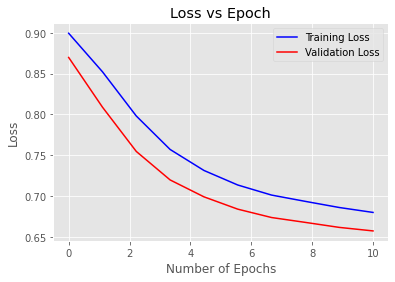

In [ ]:
plt.plot(np.linspace(0,len(epoch_loss_values),len(epoch_loss_values)),epoch_loss_values,color='blue', label='Training Loss')
plt.plot(np.linspace(0,len(val_loss_values),len(val_loss_values)),val_loss_values,color='red', label='Validation Loss')
plt.legend()
plt.title("Loss vs Epoch")
plt.xlabel("Number of Epochs")
plt.ylabel("Loss")

### Visualizing the results

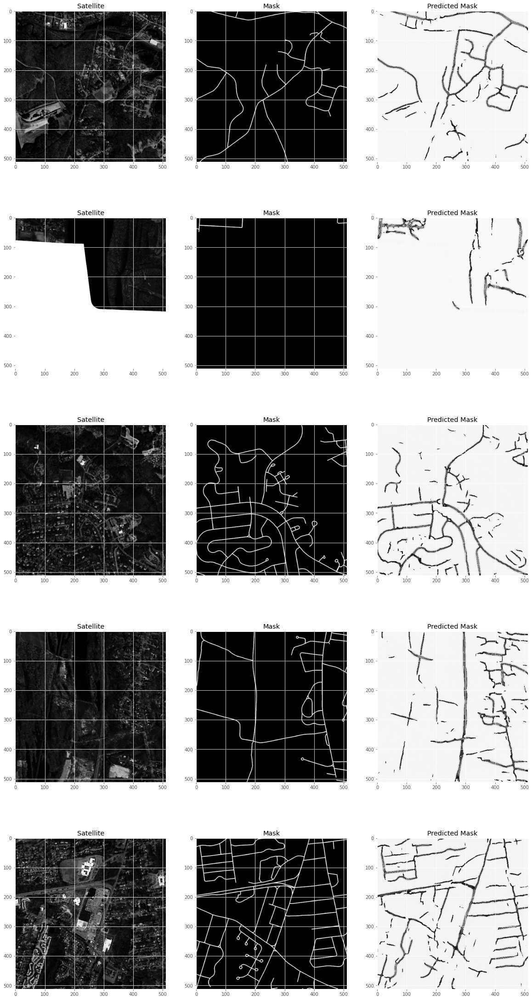

In [ ]:
r = 5
i=0
fig,ax = plt.subplots(r,3,figsize=(20,40))
for batch in test_loader:
    inp = torch.reshape(batch['img'],(1,1,512,512))
    out = model(inp).to('cpu')
    ax[i,0].imshow(batch['img'][0,0,:,:],cmap='gray')
    ax[i,0].title.set_text('Satellite')
    ax[i,1].imshow(batch['mask'][0,0,:,:],cmap='gray')
    ax[i,1].title.set_text('Mask')
    ax[i,2].imshow(out[0,0,:,:].detach().numpy().astype('uint8'),cmap='gray')
    ax[i,2].title.set_text('Predicted Mask')
    if i>=r-1:
        break
    i=i+1

In [ ]:
!pip freeze > requirement.txt

#References<br>
[1] Futrega, Michał, et al. "Optimized U-Net for Brain Tumor Segmentation." arXiv preprint arXiv:2110.03352 (2021).

[2] U.Baid, et al., The RSNA-ASNR-MICCAI BraTS 2021 Benchmark on Brain Tumour Segmentation and Radiogenomic Classification, arXiv:2107.02314, 2021.

[3] Mateusz Buda, AshirbaniSaha, Maciej A. Mazurowski "Association of genomic subtypes of lower-grade gliomas with shape features automatically extracted by a deep learning algorithm." Computers in Biology and Medicine, 2019.

[4] Ronneberger, O., Fischer, P., Brox, T.: U-Net: Convolutional Networks for Biomedical Image Segmentation. In: Navab, N., Hornegger, J., Wells, W.M., Frangi, A.F. (eds.) Medical Image Computing and Computer-Assisted Intervention { MICCAI 2015. pp. 234} 241. Springer International Publishing, Cham (2015)

[5] Mnih, Volodymyr. Machine learning for aerial image labeling. University of Toronto (Canada), 2013.

[6] N. Y. Q. Abderrahim, S. Abderrahim and A. Rida, "Road Segmentation using U-Net architecture," 2020 IEEE International conference of Moroccan Geomatics (Morgeo), 2020, pp. 1-4, doi: 10.1109/Morgeo49228.2020.9121887.

